# Covariates Design matrix and decision models for Z matrix
---

This notebook generates data sets to build our Z matrices based on our model:       
    
        𝐘 = 𝐗 𝛃 𝐙' + 𝐄 , where    

- 𝐘 is the outcome data matrix (metabolite levels)
- 𝐗 is a design matrix constructed from individual covariates (e.g., phenotype status)
- 𝛃 is the coefficient matrices to estimate
- 𝐙 is a design matrix constructed from outcome covariates (e.g., information about pathways)
- 𝐄 is random error assumed to have mean zero, independent across individuals, but possibly correlated across outcomes

## Input

### Libraries

In [1]:
# To use RCall for the first time, one needs to 
# the location of the R home directory.
firstTimeRCall = false
if firstTimeRCall 
    ENV["R_HOME"] = "C:/PROGRA~1/R/R-40~1.4" # from R.home() in R
    Pkg.build("RCall")
end     

In [2]:
using CSV, DataFrames, Missings#, DataFramesMeta, CategoricalArrays
using StatsBase, StatsModels
using Plots, StatsPlots, Plots.PlotMeasures, Colors, ColorSchemes
using MatrixLM, LinearAlgebra, Distributions, FreqTables
using StatsBase, HypothesisTests, MultipleTesting  #, Statistics, MultivariateStats, MatrixLM, Random, Distributions
using RCall
# using LinearAlgebra, RCall
# using FreqTables, Plots
# using StatsPlots

### Ext. Functions

In [3]:
include(joinpath(@__DIR__, "..", "..", "src","wrangle_utils.jl" ));
include(joinpath(@__DIR__, "..", "..", "src","utils.jl" ));
include(joinpath(@__DIR__, "..", "..", "src","demog.jl" ));
include(joinpath(@__DIR__, "..", "..", "src","mLinearModel.jl" ));

### Load data

Individual covariates:

In [4]:
fileIndividuals = joinpath(@__DIR__,"..","..","data","processed","COPDGene","COPDGene_ClinicalCovariates.csv");
dfInd = CSV.read(fileIndividuals, DataFrame);
# keep complete cases
dfInd = dfInd[findall(completecases(dfInd)), :];

Metabolites covariates:

In [5]:
# Get reference metabolite file
fileRef = joinpath(@__DIR__,"..","..","data","processed","COPDGene","refMeta.csv");
dfRef = CSV.read(fileRef, DataFrame);

In [6]:
# Sort according to compID 
sort!(dfRef, [:CompID]);

Metabolites responses:

In [7]:
# Get metabolite file
fileMeta = joinpath(@__DIR__,"..","..","data","processed","COPDGene","inl2_Meta.csv");
dfMet = CSV.read(fileMeta, DataFrame);

In [8]:
first(funStandardize!(dfMet, tocenter = true), 3)

,SampleID,comp553,comp38768,comp38296,comp62533,comp48762,comp34404,comp32391
,String15,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,NJHC-00611,-0.57921,1.84134,0.748882,0.0858676,-0.57266,-0.708099,-0.309593
2,NJHC-00004,2.45939,0.145757,0.0644111,0.00995041,0.999167,-0.53423,0.128401
3,NJHC-00006,-0.57921,1.0695,0.681345,-0.231025,-0.552358,-0.963579,-0.313914


Sort column name.

In [9]:
# Order compID columns
dfMet = dfMet[!, vcat([:SampleID], Symbol.(sort(names(dfMet)[2:end])))]
first(dfMet, 3)

,SampleID,comp1105,comp1107,comp1110,comp1114,comp1118,comp1121,comp1123
,String15,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,NJHC-00611,0.728162,-1.06166,0.521195,0.0224421,-0.793651,1.14514,0.602462
2,NJHC-00004,1.2142,-0.329079,0.17308,-0.388172,0.585151,0.494334,0.137678
3,NJHC-00006,0.439633,0.817412,-0.531919,-0.0280335,-0.431081,0.596034,-0.369982


Check that SampleID in Y and X are row-wise identical.

In [10]:
dfMet.SampleID == dfInd.SampleID

true

In [11]:
# get the outcome matrix 
mY = Matrix(dfMet[:,2:end]);
# get number of columns in the outcome matrix
m = size(mY, 2)

999

## Individual Characteristics

Initial glimpse at the dataset:

In [12]:
dfInd.SmokingPackYears = float.(dfInd.SmokingPackYears);
dfInd.PercentEmphysema = float.(dfInd.PercentEmphysema);

In [13]:
first(dfInd, 5)

,SampleName,SampleID,Site,FinalGold,Sex,Age,BMI,SmokingPackYears
,String7,String15,String3,Int64,String7,Float64,Float64,Float64
1,10010J,NJHC-00611,NJC,2,Female,73.5,27.51,30.7
2,10031R,NJHC-00004,NJC,2,Male,66.3,22.77,46.9
3,10032T,NJHC-00006,NJC,2,Female,66.3,31.78,40.0
4,10052Z,NJHC-00708,NJC,4,Male,55.1,26.08,39.5
5,10055F,NJHC-01099,NJC,0,Male,75.8,26.95,20.0


### Just sex

In [14]:
# Generate X matrix
contrasts = Dict(:Sex => EffectsCoding(base = "Female"))
frml = @formula(y ~ 1 + Sex).rhs
# mf = ModelFrame(@formula(y ~ 1 + Sex).rhs, dfInd)
mX = modelmatrix(frml, dfInd, hints = contrasts)
hcat(mX[1:5,:], dfInd.Sex[1:5])

5×3 Matrix{Any}:
 1.0  -1.0  "Female"
 1.0   1.0  "Male"
 1.0  -1.0  "Female"
 1.0   1.0  "Male"
 1.0   1.0  "Male"

In [15]:
size(mX, 1)

784

In [16]:
namesTstsX = ["Intercept", "Sex"];

### Covariates: Sex, COPD

In [17]:
# Generate X matrix
contrasts = Dict(:Sex => EffectsCoding(base = "Female"), 
                 :COPD => EffectsCoding(base = 0))
frml = @formula(y ~ 1 + Sex + COPD + Sex*COPD ).rhs
# mf = ModelFrame(@formula(y ~ 1 + Sex).rhs, dfInd)
mX = modelmatrix(frml, dfInd, hints = contrasts)
hcat(mX[1:5,:], dfInd.Sex[1:5])

5×5 Matrix{Any}:
 1.0  -1.0   1.0  -1.0  "Female"
 1.0   1.0   1.0   1.0  "Male"
 1.0  -1.0   1.0  -1.0  "Female"
 1.0   1.0   1.0   1.0  "Male"
 1.0   1.0  -1.0  -1.0  "Male"

In [18]:
namesTstsX = ["Intercept", "Sex", "COPD", "Sex_COPD"];

### Covariates: All covariates

In [19]:
names(dfInd)

14-element Vector{String}:
 "SampleName"
 "SampleID"
 "Site"
 "FinalGold"
 "Sex"
 "Age"
 "BMI"
 "SmokingPackYears"
 "FEV1_FVC_utah"
 "FEV1pp_utah"
 "PercentEmphysema"
 "COPD"
 "NHW"
 "CurrentSmoker"

In [20]:
dfInd.PercentEmphysema

784-element Vector{Float64}:
  2.42326
 34.7749
  6.45937
  4.27442
  1.51622
 21.8802
 11.1913
 27.7891
  1.67065
  5.78305
  1.89047
  3.56222
  4.9056
  ⋮
  1.14824
  0.534349
  3.03009
  0.160484
  2.21173
  0.127881
  2.11774
  0.591567
  3.69359
  0.679297
  0.63738
  0.320263

In [19]:
# Generate X matrix
contrasts = Dict(:Sex => EffectsCoding(base = "Female"), 
                 :COPD => EffectsCoding(base = 0),
                 :NHW => EffectsCoding(base = 0),
                 :CurrentSmoker => EffectsCoding(base = 0))
frml = @formula(y ~ 1 + Sex + COPD + NHW + CurrentSmoker  + Age + BMI+ SmokingPackYears + PercentEmphysema + 
                    Sex*COPD + Sex*NHW + Sex*CurrentSmoker + Sex*Age + Sex*BMI+ Sex*SmokingPackYears + 
                    Sex*PercentEmphysema).rhs
# frml = @formula(y ~ 1 + Sex + COPD + Sex*COPD + NHW + Sex*NHW + 
#                         CurrentSmoker + Sex*CurrentSmoker + Age + Sex*Age +
#                         BMI + Sex*BMI + SmokingPackYears + Sex*SmokingPackYears + PercentEmphysema + Sex*PercentEmphysema).rhs
# mf = ModelFrame(@formula(y ~ 1 + Sex).rhs, dfInd)
mX = modelmatrix(frml, dfInd, hints = contrasts);
mX

784×16 Matrix{Float64}:
 1.0  -1.0   1.0   1.0  -1.0  73.5  …  -73.5  -27.51  -30.7   -2.42326
 1.0   1.0   1.0   1.0  -1.0  66.3      66.3   22.77   46.9   34.7749
 1.0  -1.0   1.0   1.0  -1.0  66.3     -66.3  -31.78  -40.0   -6.45937
 1.0   1.0   1.0   1.0   1.0  55.1      55.1   26.08   39.5    4.27442
 1.0   1.0  -1.0  -1.0  -1.0  75.8      75.8   26.95   20.0    1.51622
 1.0  -1.0   1.0   1.0  -1.0  54.1  …  -54.1  -37.43  -72.0  -21.8802
 1.0   1.0   1.0   1.0   1.0  62.2      62.2   24.53   40.3   11.1913
 1.0   1.0   1.0   1.0  -1.0  78.5      78.5   28.9    81.0   27.7891
 1.0  -1.0   1.0   1.0  -1.0  75.3     -75.3  -27.62  -96.0   -1.67065
 1.0  -1.0   1.0   1.0  -1.0  67.8     -67.8  -23.72  -72.0   -5.78305
 1.0   1.0   1.0   1.0   1.0  56.2  …   56.2   37.06   68.4    1.89047
 1.0   1.0  -1.0   1.0   1.0  54.5      54.5   39.41   31.8    3.56222
 1.0   1.0   1.0   1.0   1.0  76.8      76.8   28.01   62.0    4.9056
 ⋮                             ⋮    ⋱                     

In [21]:
namesTstsX = ["Intercept",  "Sex", "COPD", "Race", "Smoker", "Age", "BMI", "PackYears", "Emphysema",
    "Sex_COPD", "Sex_Race", "Sex_PackYears", "Sex_Smoker", "Sex_Age", "Sex_BMI", "Sex_Emphysema"];

In [22]:
namesTstsX

16-element Vector{String}:
 "Intercept"
 "Sex"
 "COPD"
 "Race"
 "Smokers"
 "Age"
 "BMI"
 "PackYears"
 "Emphysema"
 "Sex_COPD"
 "Sex_Race"
 "Sex_PackYears"
 "Sex_Smokers"
 "Sex_Age"
 "Sex_BMI"
 "Sex_Emphysema"

## Metabolite Characteristics

In [20]:
first(dfRef[:,[:CompID, :SuperClassID]], 5)

,CompID,SuperClassID
,String15,String3
1,comp1105,LIP
2,comp1107,NUC
3,comp1110,LIP
4,comp1114,LIP
5,comp1118,LIP


Filter metabolites with respect to ones in the outcome matrix,*.i.e.* `dfMet`:

- Get `CompID` in the outcome dataframe`dfMet`.

In [21]:
dfMetID = DataFrame(CompID = names(dfMet)[2:end]);
first(dfMetID, 3)

,CompID
,String
1,comp1105
2,comp1107
3,comp1110


- Use the join function to filter the reference metabolites dataframe, `dfRef`.

In [22]:
# dfRef = leftjoin(dfMetID, dfRef, on = :CompID);
dfRef = rightjoin(dfRef,dfMetID, on = :CompID);
first(dfRef, 5)

,MetaID,Biochemical,CompID,SubPathway
,String15?,String?,String,String?
1,279.233_5535,linoleate (18:2n6),comp1105,Long Chain Polyunsaturated Fatty Acid (n3 and n6)
2,157.0367_1672,allantoin,comp1107,"Purine Metabolism, (Hypo)Xanthine/Inosine containing"
3,303.233_5535,arachidonate (20:4n6),comp1110,Long Chain Polyunsaturated Fatty Acid (n3 and n6)
4,357.2788_1415,deoxycholate,comp1114,Secondary Bile Acid Metabolism
5,311.2956_6240,arachidate (20:0),comp1118,Long Chain Saturated Fatty Acid


We can use the `freqtable` function to get a frequency table of sub pathways according to a class of super pathway: 

In [23]:
freqtable(dfRef.SuperPathway) |> show

10-element Named Vector{Int64}
Dim1                              │ 
──────────────────────────────────┼────
Amino Acid                        │ 180
Carbohydrate                      │  24
Cofactors and Vitamins            │  25
Energy                            │  10
Lipid                             │ 363
NA                                │ 239
Nucleotide                        │  32
Partially Characterized Molecules │   2
Peptide                           │  25
Xenobiotics                       │  99

In [24]:
freqtable(dfRef.SubPathway[findall(dfRef.SuperClassID.=="LIP")]) |> show

54-element Named Vector{Int64}
Dim1                                                         │ 
─────────────────────────────────────────────────────────────┼───
Androgenic Steroids                                          │ 14
Carnitine Metabolism                                         │  2
Ceramides                                                    │ 11
Corticosteroids                                              │  2
Diacylglycerol                                               │ 19
Dihydroceramides                                             │  2
Dihydrosphingomyelins                                        │  5
Endocannabinoid                                              │  5
Fatty Acid Metabolism (Acyl Carnitine, Dicarboxylate)        │  5
Fatty Acid Metabolism (Acyl Carnitine, Hydroxy)              │  3
Fatty Acid Metabolism (Acyl Carnitine, Long Chain Saturated) │  8
Fatty Acid Metabolism (Acyl Carnitine, Medium Chain)         │  5
Fatty Acid Metabolism (Acyl Carnitine, Monounsa

The `dfRef` dataframe is now ready to be used to build our different Z matrices.

### Build Z based on Superpathway

- Get the different levels of super pathways and sort them alphabetically.

In [25]:
levelsSup = sort(unique(dfRef.SuperClassID))

10-element Vector{Union{Missing, String3}}:
 "AMI"
 "CAR"
 "COF"
 "ENE"
 "LIP"
 "NA"
 "NUC"
 "PAR"
 "PEP"
 "XEN"

- Generate the Z matrix based on super pathways classification.

In [26]:
# Formula for model matrix
contrasts = Dict(:SuperClassID => StatsModels.FullDummyCoding());
frml = @formula(y ~ 0 + SuperClassID).rhs;
# Generate Z matrix
mZsup = modelmatrix(frml, dfRef, hints = contrasts);

We can verify than Z matrix is correct. 

In [29]:
DataFrame(hcat(mZsup[1:5,1:end], dfRef.SuperClassID[1:5]), vcat(levelsSup, ["Class"]))

,AMI,CAR,COF,ENE,LIP,NA,NUC,PAR,PEP,XEN,Class
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,LIP
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,NUC
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,LIP
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,LIP
5,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,LIP


- Check the design coding of the matrix `mZsup` :

In [30]:
levelsSup[(mapslices(x ->findall(x .== 1) , mZsup, dims = [2]))[:]] == dfRef.SuperClassID

true

### Build Z based on Subpathway

- Get the different levels of super pathways and sort them alphabetically.

In [31]:
levelsSub = sort(unique(dfRef.SubClassID));

In [32]:
# Formula for model matrix
contrasts = Dict(:SubClassID => StatsModels.FullDummyCoding());
frml = @formula(y ~ 0 + SubClassID).rhs;
# Generate Z matrix
mZsub = modelmatrix(frml, dfRef, hints = contrasts);

- Check the design coding of the matrix `mZsub` :

In [33]:
levelsSub[(mapslices(x ->findall(x .== 1) , mZsub, dims = [2]))[:]] == dfRef.SubClassID

true

# Preliminary results
---

In [34]:
# check rows match
sum(dfMet.SampleID .== dfInd.SampleName) == size(dfMet, 1)

false

In [35]:
mY = Matrix(select(dfMet, Not(1))); 

In [36]:
m = size(mY, 2)

999

## Associations at the metabolite level

At the metabolite level, we assess potential association for each metabolite; in this case we have 𝐘 = 𝐗 𝛃 + 𝐄, in other word the 𝐙 matrix is equal to the identity matrix 𝐈.

In [37]:
ZI = Matrix{Float64}(I(m));

- Get the coefficient matrix 𝛃 and their corresponding t-statistics.

In [38]:
CoefZI, CIZI, TstatZI, varZI = getCoefs(mY, mX, ZI);

In [39]:
TstatZI |> size

(4, 999)

- Join t-statistics results with the reference matrix.

In [40]:
dfTstatsZI = DataFrame(hcat(permutedims(TstatZI),names(dfMet)[2:end]), vcat(namesTstsX, ["CompID"]));
dfTstatsZI = leftjoin(dfTstatsZI, dfRef[:,[:CompID, :SuperClassID , :SubClassID]], on = :CompID); #sum(ismissing.(dfTstats.SuperClassID
dfTstatsZI |> first

,Intercept,Sex,COPD,Sex_COPD,CompID,SuperClassID,SubClassID
,Any,Any,Any,Any,Any,String3?,String7?
1,0.368871,-4.60161,1.10378,-1.37428,comp1105,LIP,LIP34


In [41]:
for i in Symbol.(namesTstsX)
    # dfTstatsZI[:, i] = float.(vec(dfTstatsZI[:, i]))
    dfTstatsZI[!,i] = convert.(Float64, dfTstatsZI[!,i])
end

In [42]:
dfTstatsZI |> first

,Intercept,Sex,COPD,Sex_COPD,CompID,SuperClassID,SubClassID
,Float64,Float64,Float64,Float64,Any,String3?,String7?
1,0.368871,-4.60161,1.10378,-1.37428,comp1105,LIP,LIP34


- In order to visualize the results per super pathways, let group the t-statistics by super class ID and get the mean of each group.

In [43]:
gdf = groupby(dfTstatsZI, :SuperClassID);
dfMeanTst = DataFrames.combine(gdf, :Sex => mean => :Sex) 
sort!(dfMeanTst, :SuperClassID);

In [44]:
dfMeanTst_COPD = DataFrames.combine(gdf, :COPD => mean => :COPD) 
sort!(dfMeanTst, :SuperClassID);

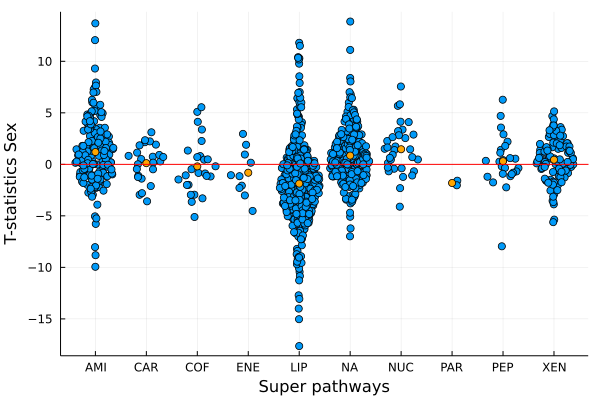

In [45]:
var2vis = Symbol("Sex")
@df dfTstatsZI dotplot(string.(:SuperClassID), :Sex, legend = false)
@df dfMeanTst scatter!(string.(:SuperClassID), :Sex, legend = false, color = :orange)
hline!([0], color= :red, label = "", xlabel = "Super pathways", ylabel = "T-statistics Sex" )

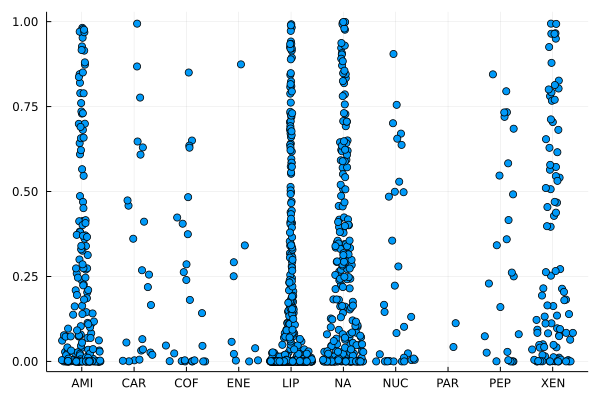

In [52]:
dfPvalsZI = copy(dfTstatsZI)
dfPvalsZI[:, 1:end-3] .= tstat2pval(Matrix(dfTstatsZI[:,1:end-3]), size(dfInd,1)-1);

@df dfPvalsZI dotplot(string.(:SuperClassID), :Sex, legend = false)
# @df dfMeanTst scatter!(string.(:SuperClassID), :Sex, legend = false, color = :orange)
# hline!([0], color= :red, label = "", xlabel = "Super pathways", ylabel = "T-statistics Sex" )

In [54]:
estimate( Matrix(dfPvalsZI[:, 1:end-3])[:], StoreyBootstrap())

0.827933196354249

In [55]:
heatmap(cor(mY),)

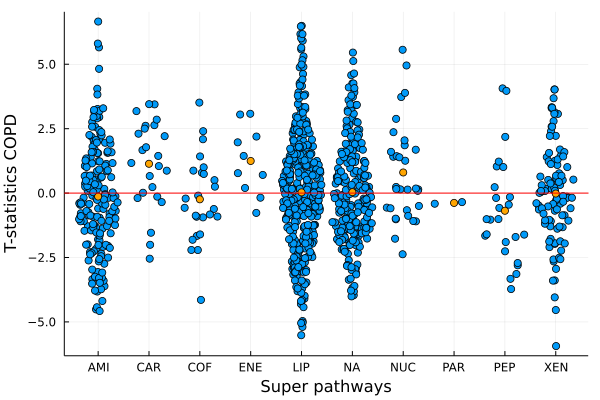

In [56]:
var2vis = Symbol("Sex")
@df dfTstatsZI dotplot(string.(:SuperClassID), :COPD, legend = false)
@df dfMeanTst_COPD scatter!(string.(:SuperClassID), :COPD, legend = false, color = :orange)
hline!([0], color= :red, label = "", xlabel = "Super pathways", ylabel = "T-statistics COPD" )

## Association at the super pathway level

At the super pathway level, we use the model 𝐘 = 𝐗 𝛃 𝐙' + 𝐄, where the 𝐙 matrix contains super pathway information of each metabolite.

In [57]:
size(mZsup)

(999, 10)

- Get the coefficient matrix 𝛃 and their corresponding t-statistics.

In [60]:
CoefZsp, CIZsp, TstatZsp, varZsp = getCoefs(mY, mX, mZsup);

In [61]:
size(TstatZsp)

(4, 10)

### Visualizations

In [70]:
# namesTstsX = ["Intercept",  "Sex", "COPD", "Race", "Smoker", "Age", "BMI", "PackYears", "Emphysema",
#     "Sex_COPD", "Sex_Race", "Sex_PackYears", "Sex_Smoker", "Sex_Age", "Sex_BMI", "Sex_Emphysema"];
namesTstsX = ["Intercept",  "Sex", "COPD", "Race"];

In [63]:
# namesX = ["Intercept" "Sex"]
# namesX = ["Sex \n(reference: Female)" "COPD \n(reference: not a case)" "Sex:COPD"]
namesX = ["Sex \n(reference: Female)" "COPD \n(reference: not a case)" "Race \n(reference: nhw)" "Smoker \n(reference: no)" "Age" "BMI" "PackYears" "Emphysema" "Sex_COPD"  "Sex_Race" "Sex_PackYears" "Sex_Smoker" "Sex_Age" "Sex_BMI" "Sex_Emphysema"]

1×15 Matrix{String}:
 "Sex \n(reference: Female)"  …  "Sex_BMI"  "Sex_Emphysema"

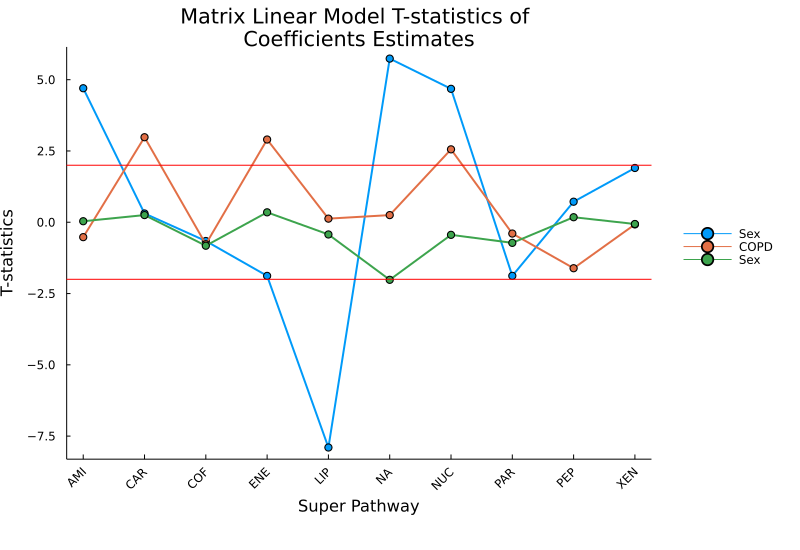

In [104]:
namesZ = string.(permutedims(levelsSup[1:end]))
plot(transpose(TstatZsp[:,1:end])[:,2:end], # [:, 1:2]
# plot(transpose(TstatZsp[:,[1,2,5,6,10]])[:,1:2],     
    label= namesX, xlabel= "Super Pathway", ylabel = "T-statistics",
    legend =:outerright, lw = 2, marker = :circle, grid = false,
    xticks = (collect(1:size(mZsup)[2]), namesZ),xrotation = 45, size = (800,550),
    foreground_color_legend = nothing, # remove box of legend   
    bottom_margin = 10mm, format = :svg,
    title = string("Matrix Linear Model T-statistics of \nCoefficients Estimates") )
hline!([2], color= :red, label = "")
hline!([-2], color= :red, label = "")

In [65]:
catTstatZsp = zeros(size(TstatZsp,1), size(TstatZsp,2));
catTstatZsp[findall(abs.(TstatZsp) .<2)].= 0;
catTstatZsp[findall((TstatZsp .>=2) .&& (TstatZsp .<3))].= 1;
catTstatZsp[findall((TstatZsp .<=-2) .&& (TstatZsp .>-3))].= -1;
catTstatZsp[findall(TstatZsp .>=3)].= 2;
catTstatZsp[findall(TstatZsp .<=-3)].= -2;
catTstatZsp

4×10 Matrix{Float64}:
 0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0  0.0  0.0
 2.0  0.0  0.0  0.0  -2.0   2.0  2.0  0.0  0.0  0.0
 0.0  1.0  0.0  1.0   0.0   0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0   0.0  -1.0  0.0  0.0  0.0  0.0

In [66]:
permutedims(TstatZsp)

10×4 Matrix{Float64}:
 -0.17938     4.70125   -0.52187     0.036466
  0.287313    0.307283   2.98274     0.251993
  0.0139594  -0.657589  -0.770917   -0.823019
  0.325141   -1.88106    2.90218     0.348602
  0.256626   -7.90008    0.127211   -0.427729
  0.0761421   5.74066    0.251143   -2.01859
  0.197363    4.6805     2.5572     -0.441285
  0.0755971  -1.87986   -0.395903   -0.722722
 -0.208267    0.720768  -1.61211     0.176956
 -0.0506795   1.90413   -0.0752059  -0.0614092

In [67]:
include(joinpath(@__DIR__,"..", "..","src","myPlots.jl" ));

In [68]:
myscheme = [RGB{Float64}(0.792, 0, 0.125),
            RGB{Float64}(0.957, 0.647, 0.51),
            RGB{Float64}(0.5, 0.5, 0.5),    
            RGB{Float64}(0.557, 0.773, 0.871),
            RGB{Float64}(0.02, 0.443, 0.69)]

In [106]:
?mlmheatmap

search: mlmheatmap mlmheatmap! MLMheatmap



No documentation found.

`mlmheatmap` is a `Function`.

```
# 1 method for generic function "mlmheatmap":
[1] mlmheatmap(args...; kw...) in Main at C:\Users\Fenril-Fractal\.julia\packages\RecipesBase\qpxEX\src\RecipesBase.jl:364
```


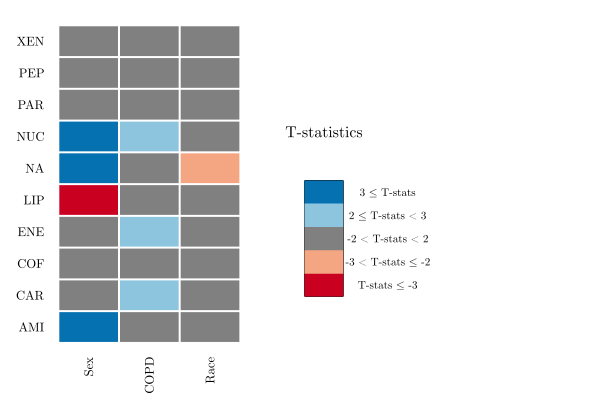

In [71]:
# labels
namesX = reshape(namesTstsX[2:end], 1, length(namesTstsX)-1)
clrbarticks = ["T-stats ≤ -3", "-3 < T-stats ≤ -2", "-2 < T-stats < 2", "2 ≤ T-stats < 3", "3 ≤ T-stats"];
n_cat = length(clrbarticks)
yt = range(0,1,n_cat+1)[1:n_cat] .+ 0.5/n_cat
myfont = "Computer Modern" 

l = @layout [ a{0.50w} [b{0.1h}; c{0.2w}] ];

mycolors =ColorScheme(myscheme)
colors = cgrad(mycolors, 5, categorical = true);

# PLOT MAIN HEATMAP
p1 = mlmheatmap(permutedims(catTstatZsp[2:end,:]), permutedims(TstatZsp[2:end,:]), 
    xticks = (collect(1:size(mZsup)[1]), namesX), xrotation = 450,
    yticks = (collect(1:size(mZsup)[2]), namesZ), tickfontfamily = myfont ,
    color = colors, cbar = false,
    annotationargs = (10, "Arial", :lightgrey), 
    linecolor = :white , linewidth = 2);

# PLOT GAP 
p2 = plot([NaN], lims=(0,1), framestyle=:none, legend=false);

# ANNOTATE COLOR BAR TITLE
annotate!(0.5, -3.02, text("T-statistics", 10, myfont))

# PLOT HEATMAP COLOR BAR
xx = range(0,1,100)
zz = zero(xx)' .+ xx
p3 = heatmap(xx, xx, zz, ticks=false, ratio=3, legend=false, 
            fc=colors, lims=(0,1), framestyle=:box, right_margin=24mm);

# ANNOTATE COLOR BAR AXIS
[annotate!(2.15, yi, text(ti, 7, myfont)) for (yi,ti) in zip(yt,clrbarticks)]

# PLOT MLMHEATMAP
plot(p1, p2, p3, layout=l, margins=2mm)

In [72]:
unique(dfRef.SuperPathway)

10-element Vector{Union{Missing, String}}:
 "Lipid"
 "Nucleotide"
 "Amino Acid"
 "Energy"
 "Carbohydrate"
 "Cofactors and Vitamins"
 "Xenobiotics"
 "Peptide"
 "NA"
 "Partially Characterized Molecules"

## Association at the subpathway level

In [73]:
CoefZsb, CIZsb, TstatZsb, varZsb = getCoefs(mY, mX, mZsub);

In [74]:
size(TstatZsb)

(4, 106)

- Get P-values from t-statistics.

In [76]:
PvalZsb = tstat2pval(TstatZsb, size(dfInd, 1) -1)

4×106 Matrix{Float64}:
 0.81746   0.840932    0.981057     …  0.916219    0.986365  0.727988
 0.251693  0.00568094  0.000878168     0.00352978  0.46957   0.377937
 0.345416  0.276256    0.295794        0.581356    0.609368  0.0178726
 0.101361  0.891027    0.974143        0.76866     0.351759  0.463221

- Get Q-values from p-values.(FDR)

In [82]:
hcat(namesTstsX, (map(i -> estimate(PvalZsb[i,:], StoreyBootstrap()), 1:4)))

4×2 Matrix{Any}:
 "Intercept"  1.0
 "Sex"        0.345912
 "COPD"       0.531732
 "Race"       1.0

In [83]:
estimate(PvalZsb[:], StoreyBootstrap())

0.8379578246392897

In [84]:
R"""
suppressMessages(library(stats))
suppressMessages(library(qvalue));
"""

RObject{StrSxp}
[1] "qvalue"    "stats"     "graphics"  "grDevices" "utils"     "datasets" 
[7] "methods"   "base"     


In [85]:
pvalues = PvalZsb[2, :];

idx = findall(x-> x>1, pvalues)
pvalues[idx] .= 1

@rput pvalues;

In [86]:
R"""
qobj <- qvalue(p = pvalues)
qVals <- qobj$qvalues;
"""
@rget qVals;

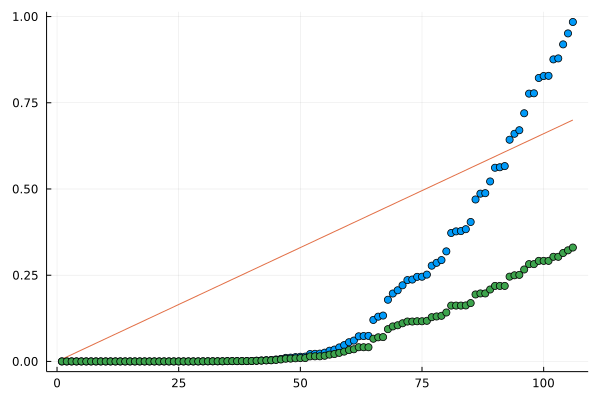

In [87]:
scatter(sort(pvalues))
plot!(x -> 0.7*x/106, 1,106)
scatter!(sort(qVals), legend = false)

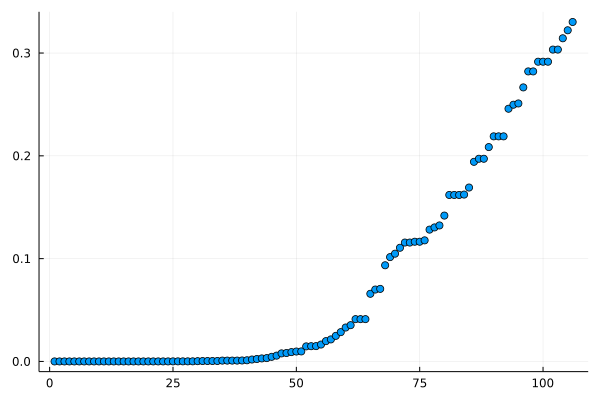

In [88]:
scatter(sort(qVals), legend = false)

In [89]:
QvalZsb = pval2qval(PvalZsb)

4×106 Matrix{Float64}:
 0.991487  0.991487    0.991487     …  0.991487    0.991487  0.991487
 0.121431  0.00462891  0.000847355     0.00300989  0.200204  0.16696
 0.294984  0.268462    0.278124        0.399602    0.404073  0.0324957
 0.97357   0.97357     0.983421        0.97357     0.97357   0.97357

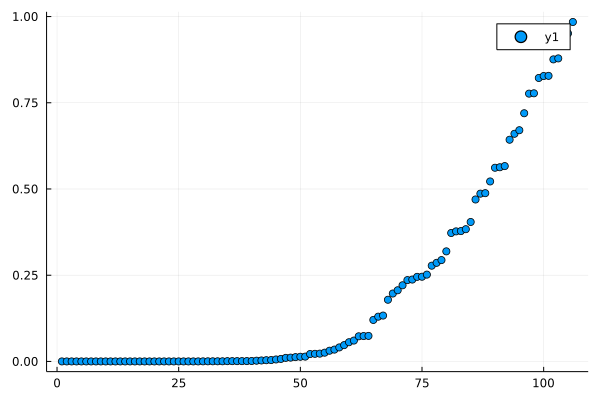

In [90]:
scatter(sort(PvalZsb[2,:]))

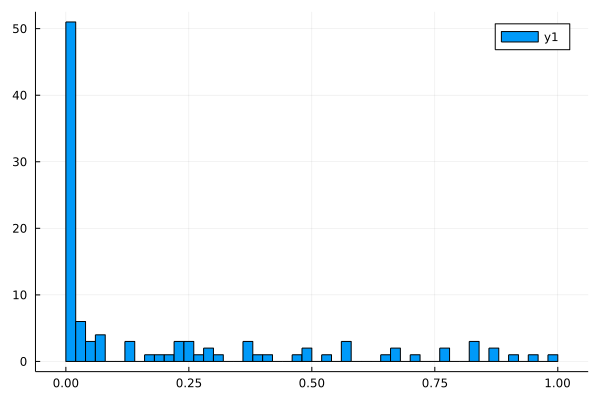

In [91]:
histogram(PvalZsb[2,:], bin = 50)

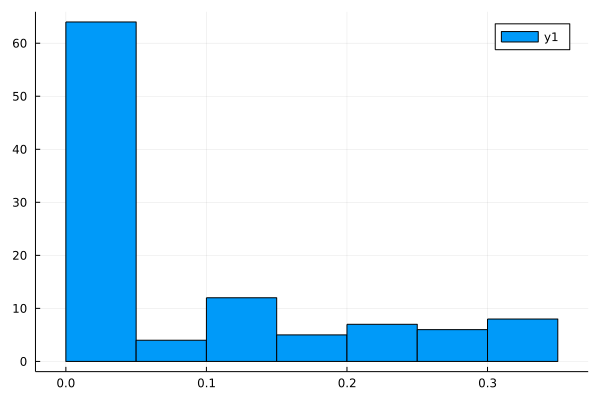

In [92]:
histogram(QvalZsb[2,:], bin = 10)

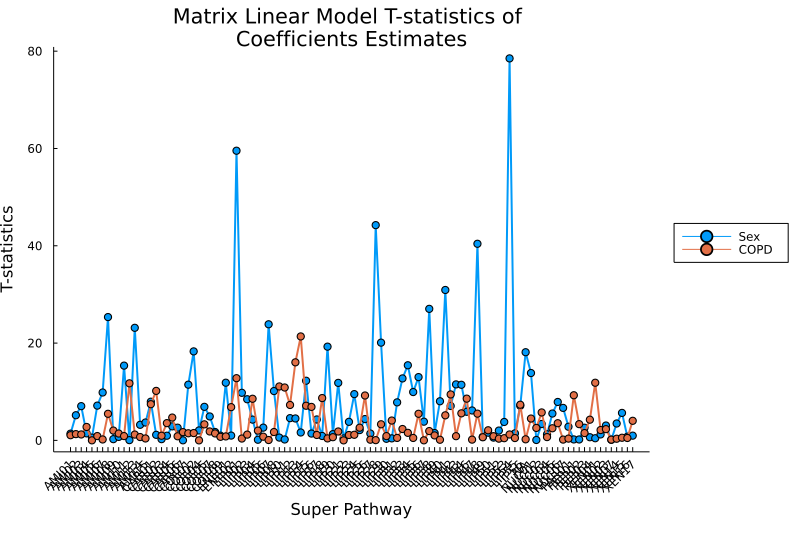

In [93]:
# namesX = ["Intercept" "Sex"]
namesX = ["Sex" "COPD"]
# namesZ = string.(permutedims(levelsSup[1:end]))
namesZ = string.(permutedims(levelsSub[1:end]))
# plot(transpose(TstatZsb[:,1:end])[:,1:2],     
# plot(transpose(PvalZsb[:,1:end])[:,2:3], 
plot(abs.(log.(transpose(PvalZsb[:,1:end])[:,2:3])), 
# plot(transpose(TstatZsp[:,[1,2,5,6,10]])[:,1:2],     
    label= namesX, xlabel= "Super Pathway", ylabel = "T-statistics",
    legend =:outerright, lw = 2, marker = :circle, grid = false,
    xticks = (collect(1:size(mZsub)[2]), namesZ),xrotation = 45, size = (800,550),
    # xticks = (collect(1:(size(mZsup)[2]-5)), namesZ[1, [1,2,5,6,10]]),xrotation = 45, size = (800,550),
        
    bottom_margin = 10mm, format = :svg,
    title = string("Matrix Linear Model T-statistics of \nCoefficients Estimates") )
# hline!([2], color= :red, label = "")
# hline!([-2], color= :red, label = "")

In [76]:
findall(TstatZsb[2,:].<-10)

Int64[]

In [95]:
namesZ[60]

"LIP30"

In [96]:
# findall(dfRef.SubClassID.=="LIP36")
dfRef.SubPathway[findall(dfRef.SubClassID.=="LIP36")]

24-element PooledArrays.PooledVector{Union{Missing, String}, UInt32, Vector{UInt32}}:
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"
 "Lysophospholipid"

In [97]:
length(unique(dfRef.SubClassID))

106

In [98]:
df2 = DataFrame(SubClassID = unique(dfRef.SubClassID) , SubPathway = unique(dfRef.SubPathway));

In [99]:
df = DataFrame(SubClassID = vec(namesZ), Tstats = TstatZsb[2,:]);
df = filter(row-> abs(row.Tstats) >=2,  df)
df3  = leftjoin(df, df2, on = :SubClassID) |> (x -> show(x, allrows = true))

58×3 DataFrame
 Row │ SubClassID  Tstats     SubPathway                        
     │ String      Float64    String?                           
─────┼──────────────────────────────────────────────────────────
   1 │ LIP34        -5.24905  Long Chain Polyunsaturated Fatty…
   2 │ NUC01         4.9369   Purine Metabolism, (Hypo)Xanthin…
   3 │ LIP35        -4.08599  Long Chain Saturated Fatty Acid
   4 │ AMI08         6.91357  Leucine, Isoleucine and Valine M…
   5 │ AMI14         2.05105  Tyrosine Metabolism
   6 │ AMI13         6.57436  Tryptophan Metabolism
   7 │ NUC06         3.57468  Pyrimidine Metabolism, Thymine c…
   8 │ AMI15         2.23948  Urea cycle; Arginine and Proline…
   9 │ NUC05         2.88654  Pyrimidine Metabolism, Orotate c…
  10 │ COF05        -3.29983  Pantothenate and CoA Metabolism
  11 │ LIP28        -9.3954   Glycerolipid Metabolism
  12 │ XEN14         2.15996  Drug - Topical Agents
  13 │ LIP02         4.04893  Carnitine Metabolism
  14 │ LIP46        -2.

In [100]:
length(names(dfMet)[2:end])

999

In [101]:
dfRef.idx = collect(1:size(dfRef,1)).+1;
dfIdx = select(sort(dfRef, :SuperClassID), [:idx, :SuperClassID]);
classFreq = freqtable(dfIdx.SuperClassID)# |>display
classIDx = zeros(Int, length(classFreq))
tmp = vec(Int.(floor.(classFreq[:]./2))[:])
classIDx_cumsum = cumsum(vec(classFreq))# classIDx_cumsum[2:end] = classIDx_cumsum[2:end] + tmp[2:end]
classIDx[2:end] =classIDx_cumsum[1:end-1] + tmp[2:end] 
classIDx[1] = tmp[1]
classIDx


10-element Vector{Int64}:
  90
 192
 216
 234
 420
 721
 857
 874
 887
 949

In [102]:
hcat(unique(dfRef.SuperPathway), unique(dfRef.SuperClassID))

10×2 Matrix{Union{Missing, String}}:
 "Lipid"                              "LIP"
 "Nucleotide"                         "NUC"
 "Amino Acid"                         "AMI"
 "Energy"                             "ENE"
 "Carbohydrate"                       "CAR"
 "Cofactors and Vitamins"             "COF"
 "Xenobiotics"                        "XEN"
 "Peptide"                            "PEP"
 "NA"                                 "NA"
 "Partially Characterized Molecules"  "PAR"

In [105]:
heatmap(cor(Matrix(dfMet[:,dfIdx.idx])), c = :RdBu, clim=(-1,1), right_margin = 5mm,
         xticks = (classIDx, namesZ), xrotation = 90,
         yticks = (classIDx, namesZ), yrotation = 0, size = (1000,900))
# heatmap(cor(Matrix(dfMet[:,dfIdx.idx])), c = :vik, clim=(-1,1))

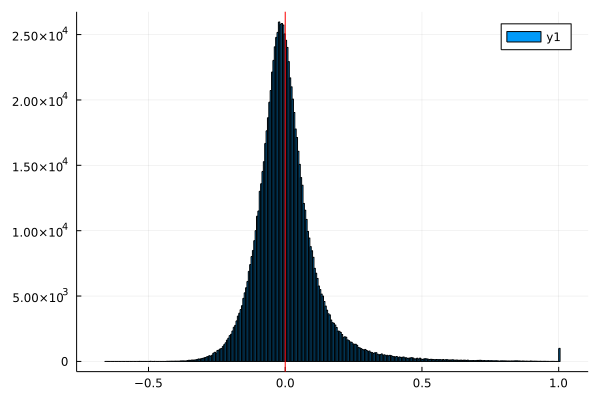

In [64]:
histogram(vec(cor(Matrix(dfMet[:,2:end]))))
vline!([0], color= :red, label = "")

In [65]:
select(sort(dfRef, :SuperClassID), [:SubPathway, :SuperPathway]) |> show

999×2 DataFrame
 Row │ SubPathway                         SuperPathway 
     │ String?                            String?      
─────┼─────────────────────────────────────────────────
   1 │ Leucine, Isoleucine and Valine M…  Amino Acid
   2 │ Alanine and Aspartate Metabolism   Amino Acid
   3 │ Tyrosine Metabolism                Amino Acid
   4 │ Leucine, Isoleucine and Valine M…  Amino Acid
   5 │ Glycine, Serine and Threonine Me…  Amino Acid
   6 │ Tyrosine Metabolism                Amino Acid
   7 │ Lysine Metabolism                  Amino Acid
   8 │ Methionine, Cysteine, SAM and Ta…  Amino Acid
   9 │ Tryptophan Metabolism              Amino Acid
  10 │ Polyamine Metabolism               Amino Acid
  11 │ Lysine Metabolism                  Amino Acid
  ⋮  │                 ⋮                       ⋮
 990 │ Food Component/Plant               Xenobiotics
 991 │ Food Component/Plant               Xenobiotics
 992 │ Food Component/Plant               Xenobiotics
 993 │ Food Component/

#### Let check t-statistics for the following super pathway set {AMI, CAR, LIP, NA, XEN}:

In [51]:
df = copy(dfMet);
df = leftjoin(select(dfInd, [:SampleID, :Sex]), df, on = :SampleID);
df = select(df, Not([:SampleID]));
grpSubsetMet = groupby(df, :Sex );

first(grpSubsetMet[1])

vTst = zeros(size( df, 2)-1);
for i in 2:size( df, 2)
    # vTst[i-1] = UnequalVarianceTTest(Float64.(grpSubsetMet[1][:, i]), Float64.(grpSubsetMet[2][:, i])).t
    vTst[i-1] = UnequalVarianceTTest(Float64.(grpSubsetMet[2][:, i]), Float64.(grpSubsetMet[1][:, i])).t
end

dfTst = DataFrame(CompID = names(df)[2:end], Tstat = vTst);
dfTst = leftjoin(dfTst, select(dfRef,  [:CompID, :SuperClassID]), on = :CompID);
dfTst = filter(row -> ⊆([row.SuperClassID], ["LIP", "NA"]), dfTst);

dfTst = filter(row -> ⊆([row.SuperClassID], [ "LIP"]), dfTst)
vNames = Symbol.(dfTst.CompID);

gdf2 = groupby(dfTst, :SuperClassID, sort = true);
dfMeanTst2 = combine(gdf2, :Tstat => mean => :Tstat) 
sort!(dfMeanTst2, :SuperClassID)

@df dfTst dotplot(string.(:SuperClassID), :Tstat, legend = false)
@df dfMeanTst2 scatter!(string.(:SuperClassID), :Tstat, legend = false)


dfSubsetRef =  select(filter(row -> ⊆([row.SuperClassID], ["AMI", "CAR", "LIP", "NA", "XEN"]), dfRef), [:CompID, :SuperClassID])
grpSubsetRef = groupby(dfSubsetRef, :SuperClassID, sort = true);

dfSubsetTstatsZI = filter(row -> ⊆([row.SuperClassID], ["AMI", "CAR", "LIP", "NA", "XEN"]), dfTstatsZI);
gdfSubset = groupby(dfSubsetTstatsZI, :SuperClassID);
dfMeanSubsetTstZI = combine(gdfSubset, :Sex => mean => :Sex);
sort!(dfMeanSubsetTstZI, :SuperClassID)

@df dfSubsetTstatsZI dotplot(string.(:SuperClassID), :Sex, legend = false)
@df dfMeanSubsetTstZI scatter!(string.(:SuperClassID), :Sex, legend = false, color= :orange)
hline!([0], color= :red, label = "")

LoadError: ArgumentError: column name :Gender not found in the data frame